<h1 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Urdu Speech Synthesis & Voice Cloning</h1>

#### Voice cloning and text-to-speech (TTS) technologies have advanced remarkably due to deep learning and neural networks. Voice cloning creates synthetic replicas of human voices, primarily through speaker adaptation or speaker encoding, for applications like virtual assistants and audiobooks.
#### TTS converts written text into speech and has evolved from concatenative methods, which used pre-recorded speech segments, to neural TTS models like WaveNet and Tacotron, which generate natural and expressive speech. These technologies enhance user interactions in virtual assistants, create accessible tools for the visually impaired, and improve customer service.

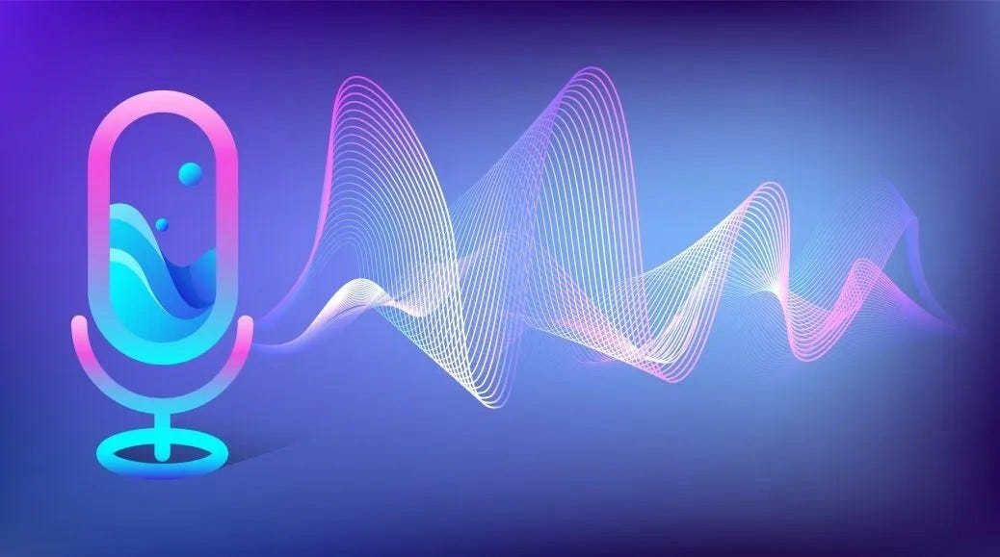

<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 1: Installing Libraries</h2>

In [3]:
!pip install TTS
!pip install -U "transformers==4.40.0" --upgrade
!pip install accelerate bitsandbytes
!pip install numpy==1.23
!pip install fastapi pyngrok uvicorn aiofiles nest-asyncio librosa

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  Using cached numpy-1.22.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.0 kB)
Using cached numpy-1.22.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.0
    Uninstalling numpy-1.23.0:
      Successfully uninstalled numpy-1.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.6.1 requires cubinlinker, which is not installed.
cudf 24.6.1 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.6.1 requires ptxcompiler, which is not installed.
cuml 24.6.1 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.6.1 requires cupy-cuda11x>=12.0.0, which is not installed.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
ucx-py 0.38.0 requires libucx<1.16,>=1.15.0, which is not installed.
ucxx 

<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 2: Loading Libraries & Models</h2>

In [4]:
# Import Libraries
import os
import torch
import torchaudio
import transformers
from TTS.tts.configs.xtts_config import XttsConfig
from TTS.tts.models.xtts import Xtts
from IPython.display import Audio, display

import warnings
warnings.simplefilter("ignore")

In [5]:
# Loading Model
model_id = "unsloth/llama-3-8b-Instruct-bnb-4bit"
pipeline = transformers.pipeline(
    "text-generation",
    model=model_id,
    model_kwargs={
        "torch_dtype": torch.float16,
        "quantization_config": {"load_in_4bit": True},
        "low_cpu_mem_usage": True,
    },)

2024-07-30 10:23:38.219147: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-30 10:23:38.219272: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-30 10:23:38.363173: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.


model.safetensors:   0%|          | 0.00/5.70G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/131 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/51.1k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [6]:
# Load the model
config = XttsConfig()
config.load_json("/kaggle/input/xtts/pytorch/xtts_main/1/config.json")
model = Xtts.init_from_config(config)
model.load_checkpoint(config, checkpoint_dir="/kaggle/input/xtts/pytorch/xtts_main/1", use_deepspeed=False)
model.cuda()

Xtts(
  (gpt): GPT(
    (conditioning_encoder): ConditioningEncoder(
      (init): Conv1d(80, 1024, kernel_size=(1,), stride=(1,))
      (attn): Sequential(
        (0): AttentionBlock(
          (norm): GroupNorm32(32, 1024, eps=1e-05, affine=True)
          (qkv): Conv1d(1024, 3072, kernel_size=(1,), stride=(1,))
          (attention): QKVAttention()
          (x_proj): Identity()
          (proj_out): Conv1d(1024, 1024, kernel_size=(1,), stride=(1,))
        )
        (1): AttentionBlock(
          (norm): GroupNorm32(32, 1024, eps=1e-05, affine=True)
          (qkv): Conv1d(1024, 3072, kernel_size=(1,), stride=(1,))
          (attention): QKVAttention()
          (x_proj): Identity()
          (proj_out): Conv1d(1024, 1024, kernel_size=(1,), stride=(1,))
        )
        (2): AttentionBlock(
          (norm): GroupNorm32(32, 1024, eps=1e-05, affine=True)
          (qkv): Conv1d(1024, 3072, kernel_size=(1,), stride=(1,))
          (attention): QKVAttention()
          (x_proj): Ide

In [7]:
# Folder path containing speaker wavs
folder_path_female = "/kaggle/input/female-audios-for-inference"
folder_path_male = "/kaggle/input/male-audios-for-inferencing"
# List all files in the folder
files_male = [os.path.join(folder_path_male, file) for file in os.listdir(folder_path_male) if file.endswith(".wav")]
files_female = [os.path.join(folder_path_female, file) for file in os.listdir(folder_path_female) if file.endswith(".wav")]

<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 3: Performing Transliteration</h2>

In [8]:
# Defining Urdu Sentences
urdu_sentences = [
    "میرا نام عاصم ہے",
    "سچ بولنا اچھا ہوتا ہے",
    "آج بارش ہو رہی ہے",
    "کیا آپ کو کھیلنا پسند ہے",
]

In [9]:
# Transliterating using Llama 3 Model
sentences_transliterated = []
for i in urdu_sentences:
    messages = [
        {"role": "system", "content": "You are a linguistic expert that transliterates Urdu text to Hindi language script. Donot give the english script, give only hindi script. Only give the transliteration and not meaning"},
        {"role": "user", "content": i}, 
    ]

    prompt = pipeline.tokenizer.apply_chat_template(
            messages,
            tokenize=False,
            add_generation_prompt=True
    )

    terminators = [
        pipeline.tokenizer.eos_token_id,
        pipeline.tokenizer.convert_tokens_to_ids("<|eot_id|>")
    ]

    outputs = pipeline(
        prompt,
        max_new_tokens=256,
        eos_token_id=terminators,
        do_sample=True,
        temperature=0.6,
        top_p=0.9,
    )
    sentences_transliterated.append(outputs[0]["generated_text"][len(prompt):])
print(sentences_transliterated)

['मेरा नाम असिम हे', 'सच बोलना अच्छा होता है', 'आज बरिश हो रही है', 'क्या आप को खेलना पसंद है']


<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 4: Generating Male Audios</h2>

In [10]:
# For Male Audios
gpt_cond_latent_m, speaker_embedding_m = model.get_conditioning_latents(audio_path=files_male[3])

In [11]:
# Checking the results of hyperparameter tuning on male audios
import matplotlib.pyplot as plt
hyperparameters = [
    {'temperature': 0.7, 'length_penalty': 1.0, 'repetition_penalty': 2.0, 'top_k': 50, 'top_p': 0.8, 'speed': 1.0},
    {'temperature': 0.65, 'length_penalty': 1.2, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 1.0},
    {'temperature': 0.3, 'length_penalty': 1.9, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 0.5},
]
text = sentences_transliterated[0]
for params in hyperparameters:
    out = model.inference(
        text,
        "hi",
        gpt_cond_latent_m,
        speaker_embedding_m,
        temperature=params['temperature'],
        length_penalty=params['length_penalty'],
        repetition_penalty=params['repetition_penalty'],
        top_k=params['top_k'],
        top_p=params['top_p'],
        speed=params['speed']
    )

    print(f"Urdu Sentence: {urdu_sentences[0]}")
    print(f"Hyperparameters: {params}")
    display(Audio(out["wav"], rate=24000))

Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.7, 'length_penalty': 1.0, 'repetition_penalty': 2.0, 'top_k': 50, 'top_p': 0.8, 'speed': 1.0}


Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.65, 'length_penalty': 1.2, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 1.0}


Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.3, 'length_penalty': 1.9, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 0.5}


In [12]:
# Generating audios for multiple sentences
for text_no in range(0, len(urdu_sentences)):
    text = sentences_transliterated[text_no]
    out = model.inference(
        text,
        "hi",
        gpt_cond_latent_m,
        speaker_embedding_m,
        temperature=0.7,
    )
    print(urdu_sentences[text_no])
    torchaudio.save("xtts_male{}.wav".format(text_no), torch.tensor(out["wav"]).unsqueeze(0), 24000)
    display(Audio(out["wav"], rate=24000))

میرا نام عاصم ہے


سچ بولنا اچھا ہوتا ہے


آج بارش ہو رہی ہے


کیا آپ کو کھیلنا پسند ہے


In [13]:
# Displaying original Audio
display(Audio(files_male[3], rate=44000))

<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 5: Generating Female Audios</h2>

In [14]:
# For Female Audios
gpt_cond_latent, speaker_embedding = model.get_conditioning_latents(audio_path=files_female[2])

In [15]:
# Checking the results of hyperparameter tuning on female audios
import matplotlib.pyplot as plt
hyperparameters = [
    {'temperature': 0.7, 'length_penalty': 1.0, 'repetition_penalty': 2.0, 'top_k': 50, 'top_p': 0.8, 'speed': 1.0},
    {'temperature': 0.65, 'length_penalty': 1.2, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 1.0},
    {'temperature': 0.3, 'length_penalty': 1.9, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 0.5},
]
text = sentences_transliterated[0]
for params in hyperparameters:
    out = model.inference(
        text,
        "hi",
        gpt_cond_latent,
        speaker_embedding,
        temperature=params['temperature'],
        length_penalty=params['length_penalty'],
        repetition_penalty=params['repetition_penalty'],
        top_k=params['top_k'],
        top_p=params['top_p'],
        speed=params['speed']
    )

    print(f"Urdu Sentence: {urdu_sentences[0]}")
    print(f"Hyperparameters: {params}")
    display(Audio(out["wav"], rate=24000))

Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.7, 'length_penalty': 1.0, 'repetition_penalty': 2.0, 'top_k': 50, 'top_p': 0.8, 'speed': 1.0}


Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.65, 'length_penalty': 1.2, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 1.0}


Urdu Sentence: میرا نام عاصم ہے
Hyperparameters: {'temperature': 0.3, 'length_penalty': 1.9, 'repetition_penalty': 1.5, 'top_k': 40, 'top_p': 0.75, 'speed': 0.5}


In [16]:
# Generating audios for multiple sentences
for text_no in range(0, len(urdu_sentences)):
    text = sentences_transliterated[text_no]
    out = model.inference(
        text,
        "hi",
        gpt_cond_latent,
        speaker_embedding,
        temperature=0.7,

    )
    print(urdu_sentences[text_no])
    torchaudio.save("xtts_female{}.wav".format(text_no), torch.tensor(out["wav"]).unsqueeze(0), 24000)
    display(Audio(out["wav"], rate=24000))

میرا نام عاصم ہے


سچ بولنا اچھا ہوتا ہے


آج بارش ہو رہی ہے


کیا آپ کو کھیلنا پسند ہے


In [17]:
# Displaying original Audio
display(Audio(files_female[2], rate=44000))

<h2 style="background-color:black;color:white;padding:10px 20px;text-align:center;">Step 6: API Development</h2>

In [18]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("HF_TOKEN")
secret_value_1 = user_secrets.get_secret("authtoken")

In [ ]:
from pyngrok import ngrok
import uvicorn
from fastapi import FastAPI, HTTPException
from fastapi.responses import FileResponse
from fastapi.middleware.cors import CORSMiddleware
from pydantic import BaseModel
import nest_asyncio
import io
import os

app = FastAPI()
app.add_middleware(
    CORSMiddleware,
    allow_origins=["*"],
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)
# Define the request model for the POST function
class TextRequest(BaseModel):
    text: str
    gender:str

# Placeholder transliteration function
def transliterate_urdu_to_hindi(urdu_sentence:str):
    messages = [
        {"role": "system", "content": "You are a linguistic expert that transliterates Urdu text to Hindi language script. Do not give the English script, give only Hindi script. Only give the transliteration and not meaning."},
        {"role": "user", "content": urdu_sentence},
    ]
    prompt = pipeline.tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )
    terminators = [
        pipeline.tokenizer.eos_token_id,
        pipeline.tokenizer.convert_tokens_to_ids("<|eot_id|>")
    ]
    outputs = pipeline(
        prompt,
        max_new_tokens=256,
        eos_token_id=terminators,
        do_sample=True,
        temperature=0.6,
        top_p=0.9,
    )
    sentence_transliterated = outputs[0]["generated_text"][len(prompt):]
    return sentence_transliterated

@app.post("/transliterate_audio/")
async def post_transliterate(request: TextRequest):
    try:
        transliterated_text = transliterate_urdu_to_hindi(request.text)
        filename = "response.wav"
        if request.gender=='male':
            gpt_cond_latent, speaker_embedding = model.get_conditioning_latents(audio_path=files_male[3])
        elif request.gender=='female':
            gpt_cond_latent, speaker_embedding = model.get_conditioning_latents(audio_path=files_female[2])
        out = model.inference(
            transliterated_text,
            "hi",
            gpt_cond_latent,
            speaker_embedding,
            temperature=0.7)
        torchaudio.save(filename, torch.tensor(out["wav"]).unsqueeze(0), 24000)
        print(os.path.dirname(os.path.abspath("response.wav")))
        #audio = FileResponse("/kaggle/working/response.wav", media_type='audio/wav', filename=filename)
        output_file = "/kaggle/working/response.wav"
        return FileResponse(output_file, media_type='audio/wav', filename=filename)
    except Exception as e:
        raise HTTPException(status_code=500, detail=str(e))


ngrok.set_auth_token(secret_value_1)
ngrok_tunnel = ngrok.connect(8000)
print('Public URL:', ngrok_tunnel.public_url)
nest_asyncio.apply()
uvicorn.run(app, port=8000)

INFO:     Started server process [34]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)


Public URL: https://2e11-35-229-125-178.ngrok-free.app
INFO:     111.68.110.30:0 - "OPTIONS /transliterate_audio HTTP/1.1" 200 OK
INFO:     111.68.110.30:0 - "POST /transliterate_audio HTTP/1.1" 307 Temporary Redirect
INFO:     111.68.110.30:0 - "OPTIONS /transliterate_audio/ HTTP/1.1" 200 OK
/kaggle/working
INFO:     111.68.110.30:0 - "POST /transliterate_audio/ HTTP/1.1" 200 OK
INFO:     111.68.110.30:0 - "OPTIONS /transliterate_audio HTTP/1.1" 200 OK
INFO:     111.68.110.30:0 - "POST /transliterate_audio HTTP/1.1" 307 Temporary Redirect
INFO:     111.68.110.30:0 - "OPTIONS /transliterate_audio/ HTTP/1.1" 200 OK
INFO:     111.68.110.30:0 - "OPTIONS /transliterate_audio/ HTTP/1.1" 200 OK
/kaggle/working
INFO:     111.68.110.30:0 - "POST /transliterate_audio/ HTTP/1.1" 200 OK
INFO:     111.68.110.30:0 - "POST /transliterate_audio HTTP/1.1" 307 Temporary Redirect
/kaggle/working
INFO:     111.68.110.30:0 - "POST /transliterate_audio/ HTTP/1.1" 200 OK
INFO:     223.123.108.176:0 - "POST 